# Gasolina Regular

In [5]:
import pandas as pd 
import numpy as np
import seaborn as sns

import statsmodels.api as sm
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.stattools import acf, pacf
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.statespace.sarimax import SARIMAX

import matplotlib.pyplot as plt

import datetime
from datetime import datetime

from darts import TimeSeries

from prophet import Prophet

In [3]:
data_consumo = pd.read_csv('DatosConsumoCombustibles.csv')
data_importaciones = pd.read_csv('DatosImportacionCombustibles.csv')

In [3]:
data_consumo.head()

,Unnamed: 0,Anio,Mes,GasolinaSuper,GasolinaRegular,TotalGasolinas,Diesel,DieselLS,DieselULS,TotalDiesel,...,AceitesLubricantes,GrasasLubricantes,Solventes,Naftas,Ceras,CrudoNacional,Butano,Orimulsion,MezclasOleosas,Total
0,3,2000,1,308156.82,202645.20,510802.02,634667.06,NaN,NaN,634667.06,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1750544.64
1,4,2000,2,307766.31,205530.96,513297.27,642380.66,NaN,NaN,642380.66,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1773220.22
2,5,2000,3,331910.29,229499.56,561409.85,699807.25,NaN,NaN,699807.25,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1909498.79
3,6,2000,4,315648.08,210680.40,526328.48,586803.98,NaN,NaN,586803.98,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1800932.86
4,7,2000,5,319667.97,208164.34,527832.31,656948.20,NaN,NaN,656948.20,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1941771.90


In [4]:
data_importaciones.head()

,Unnamed: 0,Anio,Mes,GasolinaSuper,GasolinaRegular,TotalGasolinas,Diesel,DieselLS,DieselULS,TotalDiesel,...,Solventes,Naftas,Ceras,Butano,PetroleoReconstit,MTBE,Orimulsion,MezclasOleosas,PetroleoCrudo,TotalMensual
0,3,2001,1,373963.96,177776.50,551740.46,566101.99,NaN,NaN,566101.99,...,NaN,NaN,NaN,NaN,715344.0,8402.0,NaN,NaN,NaN,2312639.05
1,4,2001,2,243091.07,123115.99,366207.06,489525.80,NaN,NaN,489525.80,...,NaN,NaN,NaN,NaN,370166.0,NaN,NaN,NaN,NaN,1769208.76
2,5,2001,3,312084.38,161726.42,473810.80,575559.68,NaN,NaN,575559.68,...,NaN,NaN,NaN,NaN,360530.0,NaN,NaN,NaN,NaN,1945770.26
3,6,2001,4,285054.89,127338.74,412393.63,437745.42,NaN,NaN,437745.42,...,NaN,NaN,NaN,NaN,359527.0,8184.0,NaN,NaN,NaN,1623637.76
4,7,2001,5,300913.67,168730.19,469643.86,552609.13,NaN,NaN,552609.13,...,NaN,NaN,NaN,NaN,723346.0,12680.0,NaN,NaN,NaN,2262726.64


In [5]:
data_consumo.dtypes

Unnamed: 0              int64
Anio                    int64
Mes                     int64
GasolinaSuper         float64
GasolinaRegular       float64
TotalGasolinas        float64
Diesel                float64
DieselLS              float64
DieselULS             float64
TotalDiesel           float64
GLP                   float64
GasolinaAviacion      float64
Kerosina              float64
TurboJet              float64
Bunker                float64
Asfalto               float64
PetCoke               float64
AceitesLubricantes    float64
GrasasLubricantes     float64
Solventes             float64
Naftas                float64
Ceras                 float64
CrudoNacional         float64
Butano                float64
Orimulsion            float64
MezclasOleosas        float64
Total                 float64
dtype: object

In [6]:
anio = data_consumo.Anio*10000
mes = data_consumo.Mes*100+1
data_consumo['Date'] = pd.to_datetime((data_consumo.Anio*10000+data_consumo.Mes*100+1).apply(str),format='%Y%m%d')

anio = data_importaciones.Anio*10000
mes = data_importaciones.Mes*100+1
data_importaciones['Date'] = pd.to_datetime((data_importaciones.Anio*10000+data_importaciones.Mes*100+1).apply(str),format='%Y%m%d')

In [7]:
data_consumo.index = data_consumo.Date
data_importaciones.index = data_importaciones.Date

# Exploración

### Regular Consumo

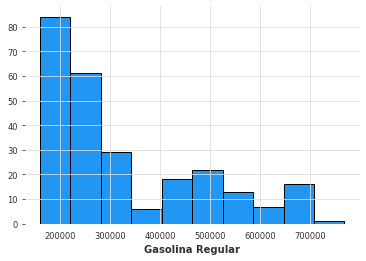

In [4]:
plt.hist(data_consumo['GasolinaRegular'], color='#2196f3',ec='black')
plt.xlabel('Gasolina Regular')
plt.show()

En la gráfica se puede observar que la cantidad que más hubo de consumo en todos los años fue entre 20000 y 30000

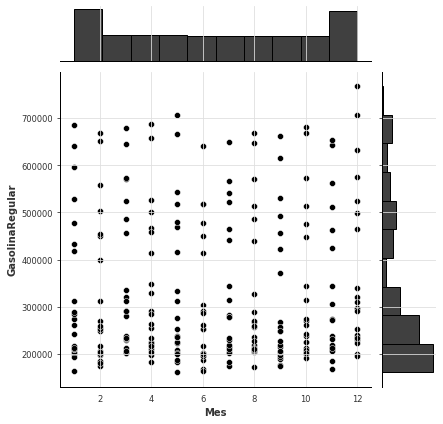

In [7]:
_ = sns.jointplot(x='Mes', y='GasolinaRegular', data=data_consumo)

Como se puede ver en la gráfica en en los meses de enero y diciembre es donde más gasolina regular fue consumida

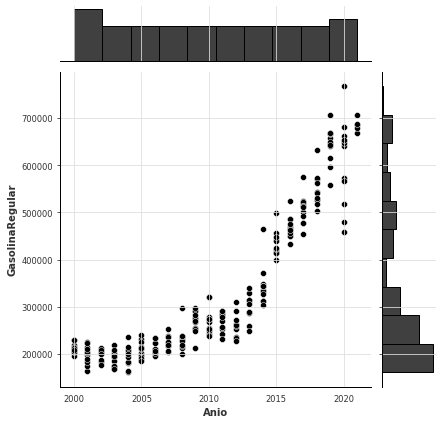

In [9]:
_ = sns.jointplot(y='GasolinaRegular', x='Anio', data=data_consumo)

La gráfica muestra que en el año 2000 y 2020 fue cuando hubo más ingreso de gasolina, diferencia es que cada año fue aumentando la cantidad consumida

### Regular Importaciones

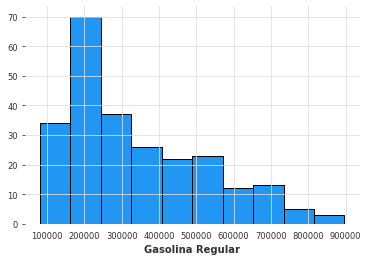

In [10]:
plt.hist(data_importaciones['GasolinaRegular'], color='#2196f3',ec='black')
plt.xlabel('Gasolina Regular')
plt.show()

En la gráfica se puede observar que la cantidad que más se importó en todos los años fue entre 20000

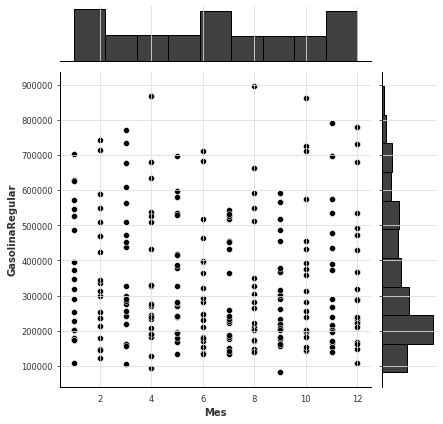

In [11]:
_ = sns.jointplot(x='Mes', y='GasolinaRegular', data=data_importaciones)

Como se puede ver en la gráfica en en los meses de enero, junio y diciembre es donde más gasolina regular fue importada

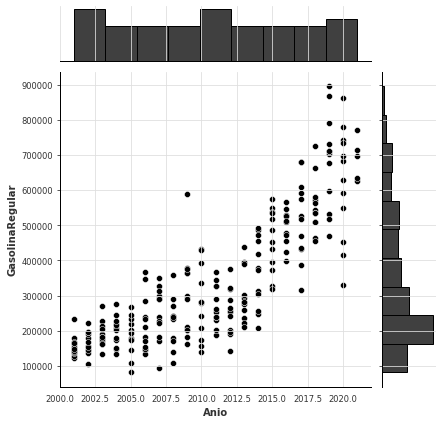

In [12]:
_ = sns.jointplot(y='GasolinaRegular', x='Anio', data=data_importaciones)

La gráfica muestra que en el año 2000, 2010 y 2020 fue cuando hubo más ingreso de gasolina, diferencia es que cada año fue aumentando la cantidad importada

# Serie univariante

### Regular consumo

In [8]:
def plot_df(df, x, y, title="", xlabel='Fecha', ylabel='Valor', dpi=1000):
    plt.figure(figsize=(16,5), dpi=dpi)
    plt.plot(x, y, color='tab:blue')
    plt.gca().set(title=title, xlabel=xlabel, ylabel=ylabel)
    plt.show()

plot_df(data_consumo, x=data_consumo.Date, y=data_consumo.GasolinaRegular, title='Gasolina Regular')

En la gráfica se puede ver como va aumentando la cantidad de gasolina, y se puede ver como en el inicio del 2020 que fue cuando empezó la pandemia hubo una gran caída en el consumo de gasolina, probablemente porque todos estaban encerrados. El inicio es en el 2000 hasta el 2020 y con frecuencia de 12 meses.

### Regular importaciones

In [9]:
plot_df(data_importaciones, x=data_importaciones.Date, y=data_importaciones.GasolinaRegular, title='Gasolina Regular')

En la gráfica se puede ver como va aumentando la cantidad de gasolina, aunque hay algunas fechas en las que sube o baja drásticamente la importación de la gasolina, y se puede ver como en el inicio del 2020 que fue cuando empezó la pandemia hubo una gran caída en la importación de gasolina. El inicio es en el 2000 hasta el 2020 y con frecuencia de 12 meses.

# Descomposición de la serie en componentes

### Regular dataset consumo

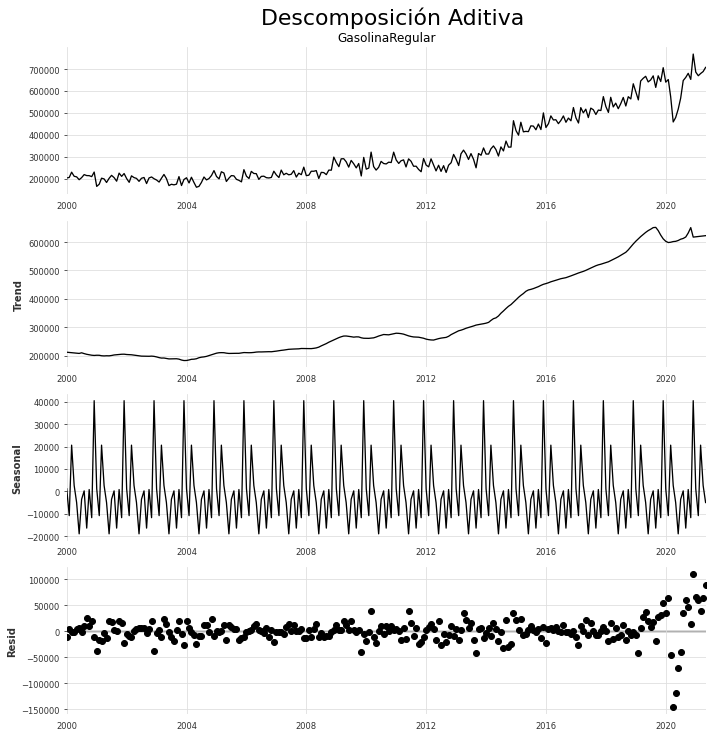

In [11]:
result_add = seasonal_decompose(data_consumo['GasolinaRegular'], model='additive', extrapolate_trend='freq')
plt.rcParams.update({'figure.figsize': (10,10)})
_ = result_add.plot().suptitle('Descomposición Aditiva', fontsize=22, x=0.55, y=1.02)

Luego hacer la descomposición se puede ver con la gráfica que dice Trend que es la tendencia, que no es estacionaria, ya que va en aumento con el tiempo.

### Regular dataset importaciones

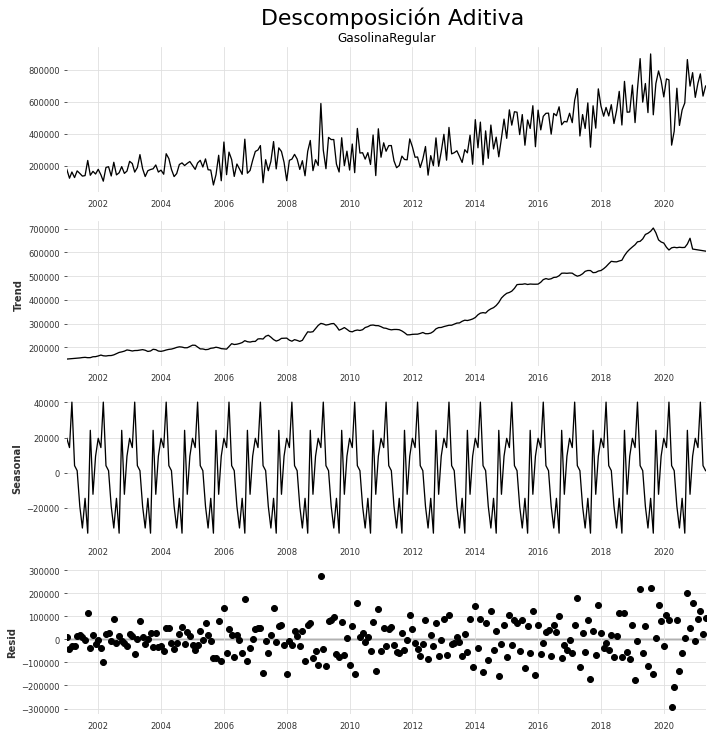

In [13]:
result_add = seasonal_decompose(data_importaciones['GasolinaRegular'], model='additive', extrapolate_trend='freq')
plt.rcParams.update({'figure.figsize': (10,10)})
_ = result_add.plot().suptitle('Descomposición Aditiva', fontsize=22, x=0.55, y=1.02)

Al igual que los datos de consumo, en este caso también va aumentando con el tiempo por lo que no es estacionaria.

# Graficos Autocorrelación

### Regular consumo

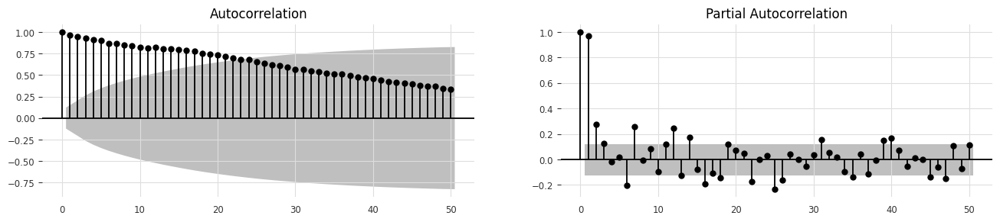

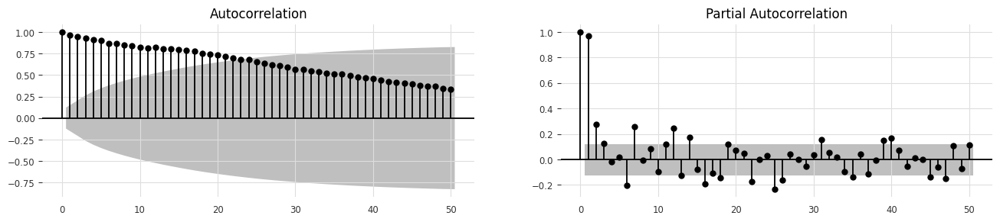

In [14]:
fig, axes = plt.subplots(1,2,figsize=(16,3), dpi= 100)
plot_acf(data_consumo.GasolinaRegular.tolist(), lags=50, ax=axes[0])
plot_pacf(data_consumo.GasolinaRegular.tolist(), lags=50, ax=axes[1])

Como se puede ver en la gráfica de autocorrelación como va tendiendo a cero es nos indica que no es estacionaria.

### Regular importaciones

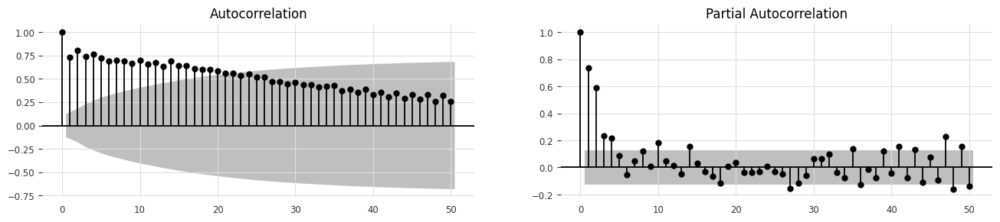

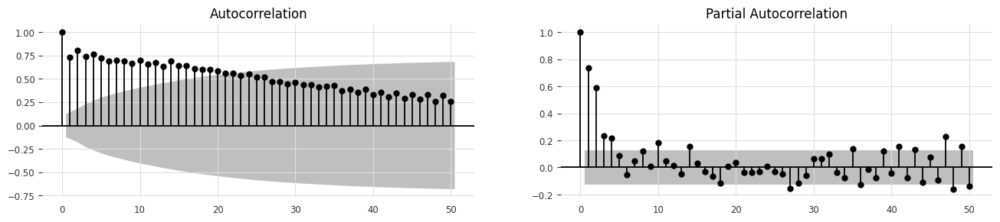

In [15]:
fig, axes = plt.subplots(1,2,figsize=(16,3), dpi= 100)
plot_acf(data_importaciones.GasolinaRegular.tolist(), lags=50, ax=axes[0])
plot_pacf(data_importaciones.GasolinaRegular.tolist(), lags=50, ax=axes[1])

Como se puede ver en la gráfica de autocorrelación como va tendiendo a cero es nos indica que no es estacionaria.

# Prueba de Dickey-Fuller

### Regular consumo

In [16]:
result = adfuller(data_consumo.GasolinaRegular, autolag='AIC')
print(f'ADF Statistic: {result[0]}')
print(f'p-value: {result[1]}')
for key, value in result[4].items():
    print('Critial Values:')
    print(f'   {key}, {value}')

ADF Statistic: 1.934697064257872
p-value: 0.998581842385286
Critial Values:
   1%, -3.4575505077947746
Critial Values:
   5%, -2.8735087323013526
Critial Values:
   10%, -2.573148434859185


Ya que el p-value es mayor al 5% nos dice que no estacionariedad en media, para que sea estacionaria en tiempo hay que hacer que la varianza y la media sean constantes.

### Regular importaciones

In [17]:
result = adfuller(data_importaciones.GasolinaRegular, autolag='AIC')
print(f'ADF Statistic: {result[0]}')
print(f'p-value: {result[1]}')
for key, value in result[4].items():
    print('Critial Values:')
    print(f'   {key}, {value}')

ADF Statistic: 0.5262262253293933
p-value: 0.9856487959759496
Critial Values:
   1%, -3.4584868856997004
Critial Values:
   5%, -2.873918902362675
Critial Values:
   10%, -2.573367247623359


Ya que el p-value es mayor al 5% nos dice que no estacionariedad en media, para que sea estacionaria en tiempo hay que hacer que la varianza y la media sean constantes.

# Modelo ARIMA

### Regular consumo

In [18]:
sarima_model = SARIMAX(data_consumo.GasolinaRegular, order=(2,0,1), seasonal_order=(2, 1, 0, 24))

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  warnings.warn('No frequency information was'
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  warnings.warn('No frequency information was'


In [19]:
results = sarima_model.fit()

In [20]:
results.aic

5430.148608656639

<AxesSubplot:>

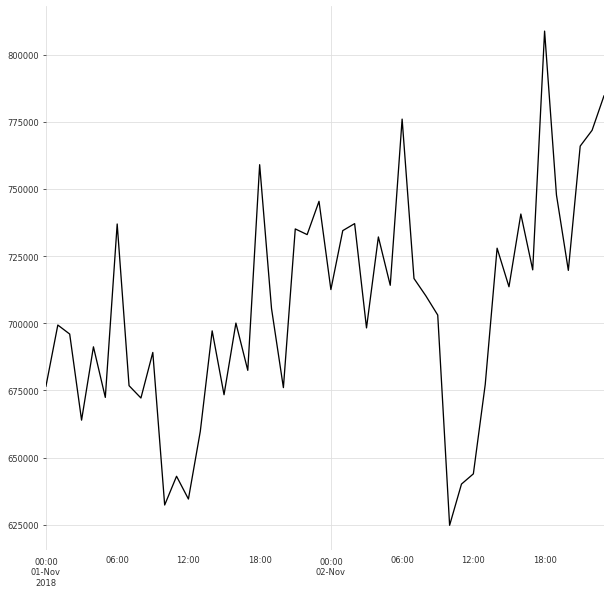

In [21]:
pred_1_2 = results.get_forecast(steps=24*2).predicted_mean
pred_1_2.index = pd.date_range(start='11/1/2018', end='11/3/2018', freq='H')[:-1]
pred_1_2.plot()

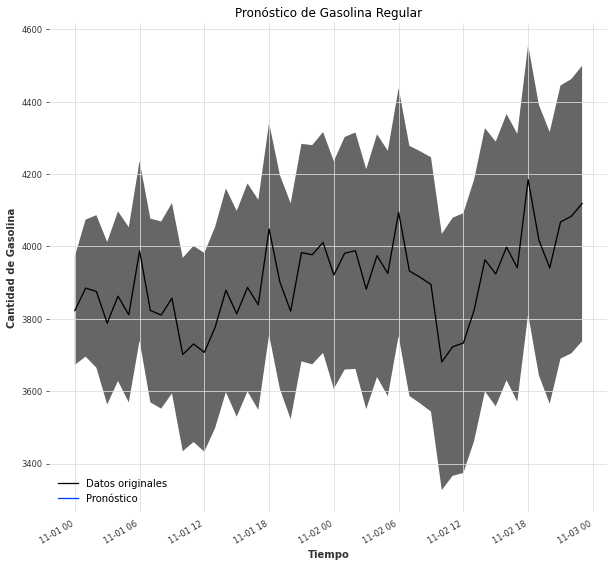

In [22]:
df_29_31 = data_consumo.loc['2018-10-29':'2018-10-31']
df_29_31.plot()

pred_1_2_conf = results.get_forecast(steps=24*2).conf_int()
pred_1_2_conf.index = pd.date_range(start='11/1/2018', end='11/3/2018', freq='H')[:-1]
pred_1_2_conf.head(15)
x = pd.date_range(start='11/1/2018', end='11/3/2018', freq='H')[:-1]
y1 = pred_1_2_conf['lower GasolinaRegular']
y2 = pred_1_2_conf['upper GasolinaRegular']
plt.fill_between(x, y1, y2, alpha=0.6)

pred_1_2 = results.get_forecast(steps=24*2).predicted_mean
pred_1_2.index = pd.date_range(start='11/1/2018', end='11/3/2018', freq='H')[:-1]
pred_1_2.plot()

plt.title('Pronóstico de Gasolina Regular')
plt.ylabel('Cantidad de Gasolina')
plt.xlabel('Tiempo')
plt.legend(('Datos originales', 'Pronóstico'),
           loc='lower left')
plt.savefig('pronostico.png')
plt.show()

Para las gráficas se el gieron los valores p,q,d de 2,0,1 ya que eran los que más se ajustaban con el tiempo en que se ingresaban nuevos datos en el dataset, ya que se hacía cada mes.

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  warnings.warn('No frequency information was'
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  warnings.warn('No frequency information was'
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  warnings.warn('No frequency information was'


                               SARIMAX Results                                
Dep. Variable:        GasolinaRegular   No. Observations:                  257
Model:                 ARIMA(5, 1, 0)   Log Likelihood               -3003.557
Date:                Fri, 06 Aug 2021   AIC                           6019.115
Time:                        17:24:00   BIC                           6040.386
Sample:                    01-01-2000   HQIC                          6027.670
                         - 05-01-2021                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.3931      0.041     -9.601      0.000      -0.473      -0.313
ar.L2         -0.1808      0.050     -3.634      0.000      -0.278      -0.083
ar.L3         -0.0208      0.050     -0.412      0.6

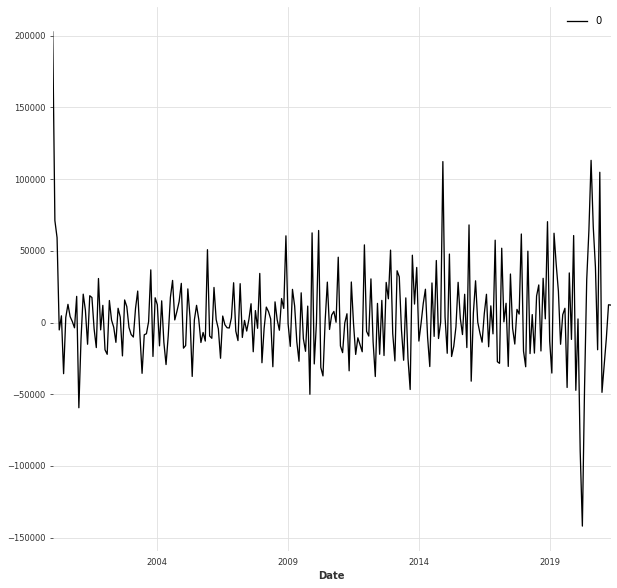

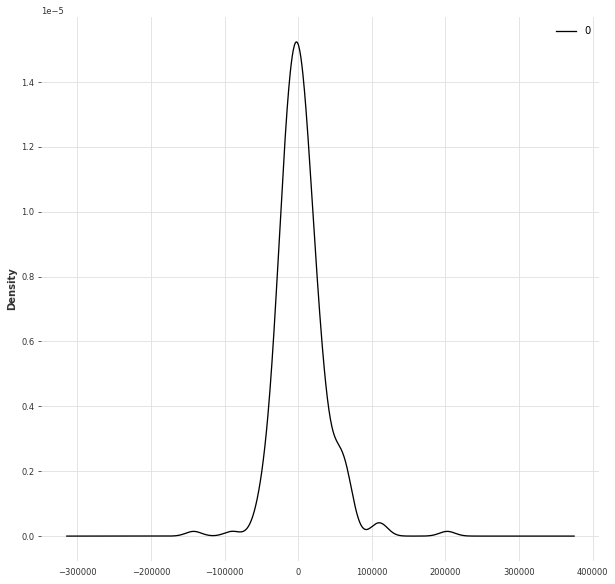

                   0
count     257.000000
mean     4068.823113
std     32445.282491
min   -141960.871142
25%    -13924.215855
50%      1291.930877
75%     17435.092265
max    202645.200000


In [23]:
model = ARIMA(data_consumo['GasolinaRegular'], order=(5,1,0))
model_fit = model.fit()
print(model_fit.summary())
residuals = pd.DataFrame(model_fit.resid)
residuals.plot()
plt.show()
residuals.plot(kind='kde')
plt.show()
# summary stats of residuals
print(residuals.describe())

In [24]:
series = TimeSeries.from_dataframe(data_consumo, 'Date', 'GasolinaRegular')

In [25]:
train, val = series.split_before(pd.Timestamp(year=2018, month=12, day=1, hour=12))

from darts.models import AutoARIMA

model_aarima = AutoARIMA()
model_aarima.fit(train)
prediction_aarima = model_aarima.predict(len(val))

In [26]:
plt.figure(figsize=(16,5), dpi=1000)
series.plot(label='actual',)
prediction_aarima.plot(label='forecast', lw=3)
plt.legend()
plt.figure(figsize=(20,5), dpi=1000)

<Figure size 20000x5000 with 0 Axes>

<Figure size 20000x5000 with 0 Axes>

In [27]:
train, val = series.split_before(pd.Timestamp(year=2020, month=1, day=1, hour=12))

model_aarima = AutoARIMA()
model_aarima.fit(train)
prediction_aarima = model_aarima.predict(len(val))

In [28]:
plt.figure(figsize=(16,5), dpi=1000)
series.plot(label='actual',)
prediction_aarima.plot(label='forecast', lw=3)
plt.legend()
plt.figure(figsize=(20,5), dpi=1000)

<Figure size 20000x5000 with 0 Axes>

<Figure size 20000x5000 with 0 Axes>

### Regular Importaciones

In [29]:
sarima_model = SARIMAX(data_importaciones.GasolinaRegular, order=(2,0,1), seasonal_order=(2, 1, 0, 24))

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  warnings.warn('No frequency information was'
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  warnings.warn('No frequency information was'


In [30]:
results = sarima_model.fit()

In [31]:
results.aic

5731.151725186774

<AxesSubplot:>

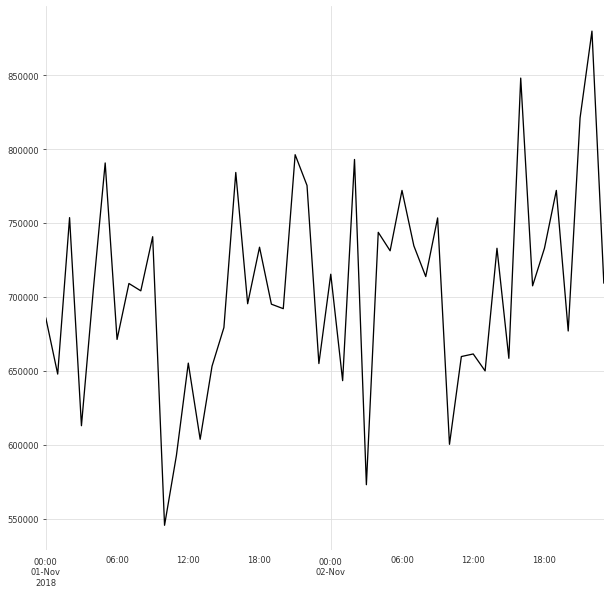

In [32]:
pred_1_2 = results.get_forecast(steps=24*2).predicted_mean
pred_1_2.index = pd.date_range(start='11/1/2018', end='11/3/2018', freq='H')[:-1]
pred_1_2.plot()

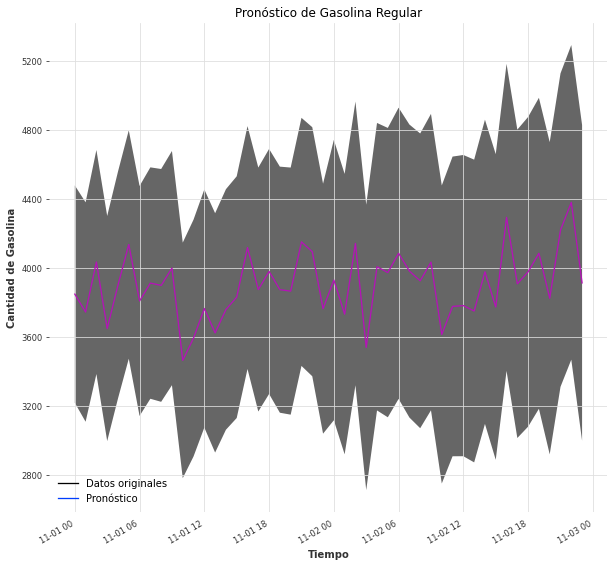

In [33]:
df_29_31 = data_importaciones.loc['2018-10-29':'2018-10-31']
df_29_31.plot()

pred_1_2_conf = results.get_forecast(steps=24*2).conf_int()
pred_1_2_conf.index = pd.date_range(start='11/1/2018', end='11/3/2018', freq='H')[:-1]
pred_1_2_conf.head(15)
x = pd.date_range(start='11/1/2018', end='11/3/2018', freq='H')[:-1]
y1 = pred_1_2_conf['lower GasolinaRegular']
y2 = pred_1_2_conf['upper GasolinaRegular']
plt.fill_between(x, y1, y2, alpha=0.6)

pred_1_2 = results.get_forecast(steps=24*2).predicted_mean
pred_1_2.index = pd.date_range(start='11/1/2018', end='11/3/2018', freq='H')[:-1]
pred_1_2.plot()

plt.title('Pronóstico de Gasolina Regular')
plt.ylabel('Cantidad de Gasolina')
plt.xlabel('Tiempo')
plt.legend(('Datos originales', 'Pronóstico'),
           loc='lower left')
plt.savefig('pronostico.png')
plt.show()

Para las gráficas se el gieron los valores p,q,d de 2,0,1 ya que eran los que más se ajustaban con el tiempo en que se ingresaban nuevos datos en el dataset, ya que se hacía cada mes.

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  warnings.warn('No frequency information was'
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  warnings.warn('No frequency information was'
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  warnings.warn('No frequency information was'


                               SARIMAX Results                                
Dep. Variable:        GasolinaRegular   No. Observations:                  257
Model:                 ARIMA(5, 1, 0)   Log Likelihood               -3003.557
Date:                Fri, 06 Aug 2021   AIC                           6019.115
Time:                        17:24:46   BIC                           6040.386
Sample:                    01-01-2000   HQIC                          6027.670
                         - 05-01-2021                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.3931      0.041     -9.601      0.000      -0.473      -0.313
ar.L2         -0.1808      0.050     -3.634      0.000      -0.278      -0.083
ar.L3         -0.0208      0.050     -0.412      0.6

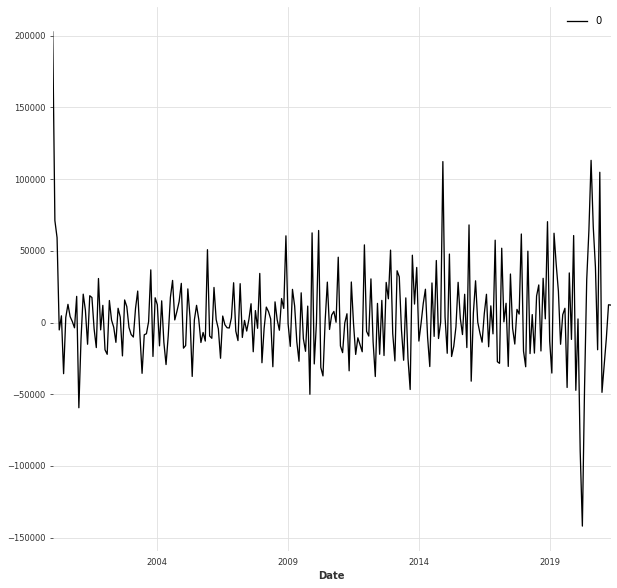

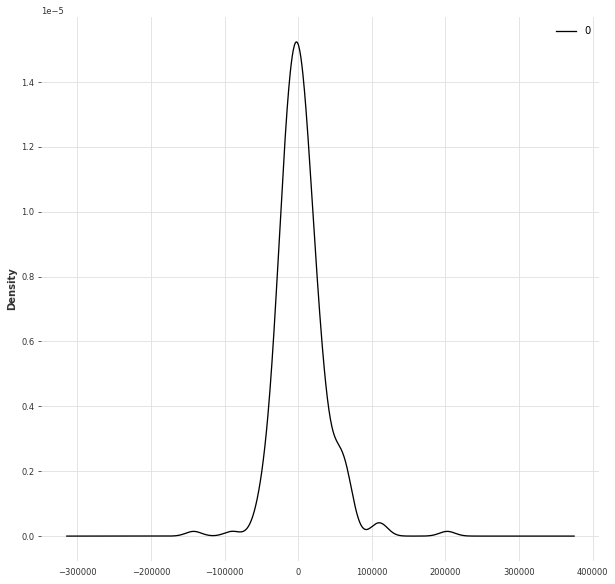

                   0
count     257.000000
mean     4068.823113
std     32445.282491
min   -141960.871142
25%    -13924.215855
50%      1291.930877
75%     17435.092265
max    202645.200000


In [34]:
model = ARIMA(data_consumo['GasolinaRegular'], order=(5,1,0))
model_fit = model.fit()
print(model_fit.summary())
residuals = pd.DataFrame(model_fit.resid)
residuals.plot()
plt.show()
residuals.plot(kind='kde')
plt.show()
# summary stats of residuals
print(residuals.describe())

In [35]:
series = TimeSeries.from_dataframe(data_importaciones, 'Date', 'GasolinaRegular')

In [36]:
train, val = series.split_before(pd.Timestamp(year=2018, month=12, day=1, hour=12))

from darts.models import AutoARIMA

model_aarima = AutoARIMA()
model_aarima.fit(train)
prediction_aarima = model_aarima.predict(len(val))

In [37]:
plt.figure(figsize=(16,5), dpi=1000)
series.plot(label='actual',)
prediction_aarima.plot(label='forecast', lw=3)
plt.legend()
plt.figure(figsize=(20,5), dpi=1000)

<Figure size 20000x5000 with 0 Axes>

<Figure size 20000x5000 with 0 Axes>

In [38]:
train, val = series.split_before(pd.Timestamp(year=2020, month=1, day=1, hour=12))

model_aarima = AutoARIMA()
model_aarima.fit(train)
prediction_aarima = model_aarima.predict(len(val))

In [39]:
plt.figure(figsize=(16,5), dpi=1000)
series.plot(label='actual',)
prediction_aarima.plot(label='forecast', lw=3)
plt.legend()
plt.figure(figsize=(20,5), dpi=1000)

<Figure size 20000x5000 with 0 Axes>

<Figure size 20000x5000 with 0 Axes>

Para ambos datasets, se ajustaba más el modelo Arima, con valores 2,0,1 para p,q y d, ya que estos se ajustan más con los tiempos que maneja el data set, probablemente si también se tuivera el día sería mejor un modelo con valores diferentes.

# Prediccion Prophet

### Regular Consumo

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


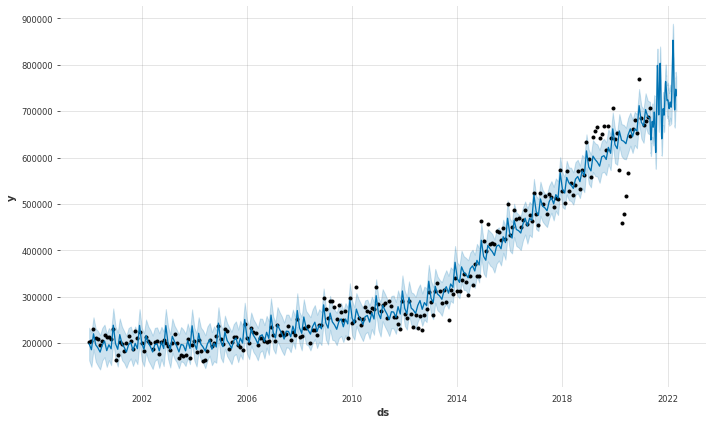

In [40]:
data_consumo["ds"] = data_consumo.Date
data_consumo["y"] = data_consumo.GasolinaRegular

data = data_consumo[["ds","y"]]

m = Prophet()
m.fit(data_consumo)

future = m.make_future_dataframe(periods=365)

forecast = m.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

fig1 = m.plot(forecast)

### Regular Importaciones

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


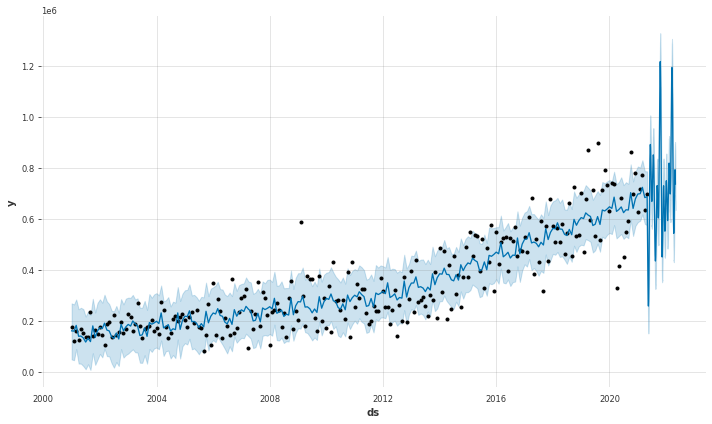

In [41]:
data_importaciones["ds"] = data_importaciones.Date
data_importaciones["y"] = data_importaciones.GasolinaRegular

data = data_importaciones[["ds","y"]]

m = Prophet()
m.fit(data_importaciones)

future = m.make_future_dataframe(periods=365)

forecast = m.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

fig1 = m.plot(forecast)

En ambos casos tanto para consumo como para importaciones la predicción hecha con el algoritmo de prophe fue bastante diferente a comparación que la de arima, ya que se puede ver que ahí afectó más los datos de la pandemia, porque para 2021 salen bastante irregulares los valores.

# Predicciones

### Últimos 3 años, Regular Consumo

In [63]:
pred = results.get_prediction(start=pd.to_datetime('01/01/2001'), dynamic=False)
pred_ci = pred.conf_int()

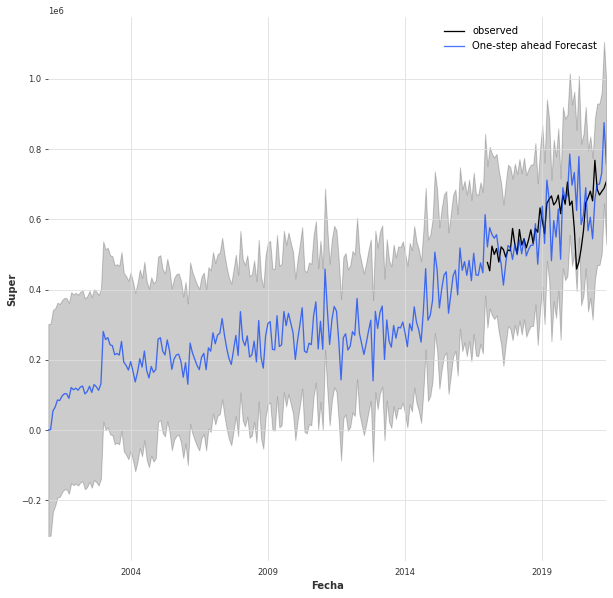

In [59]:
ax = data_consumo.GasolinaRegular['01/01/2017':].plot(label='observed')
pred.predicted_mean.plot(ax=ax, label='One-step ahead Forecast', alpha=.7)

ax.fill_between(pred_ci.index,
 pred_ci.iloc[:, 0],
 pred_ci.iloc[:, 1], color='k', alpha=.2)

ax.set_xlabel('Fecha')
ax.set_ylabel('Super')
plt.legend()

plt.show()

Se puede observar que al momento de predecir el año de la pandemia los valores son bastantes diferentes

### Últimos 3 años, Regular Importaciones

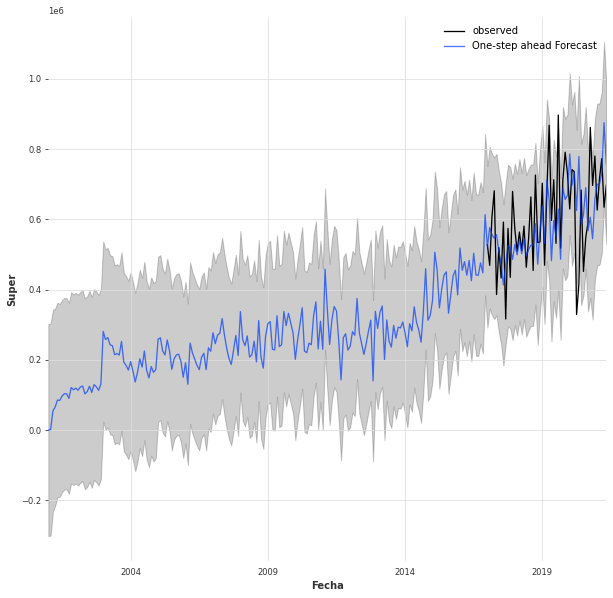

In [60]:
ax = data_importaciones.GasolinaRegular['01/01/2017':].plot(label='observed')
pred.predicted_mean.plot(ax=ax, label='One-step ahead Forecast', alpha=.7)

ax.fill_between(pred_ci.index,
 pred_ci.iloc[:, 0],
 pred_ci.iloc[:, 1], color='k', alpha=.2)

ax.set_xlabel('Fecha')
ax.set_ylabel('Super')
plt.legend()

plt.show()

Se puede ver que está gráfica tuvo unas predicciones más acertadas para estos últimos 3 años, aunque en algunos casos si hay picos más grandes.

### 2021 Regular Consumo

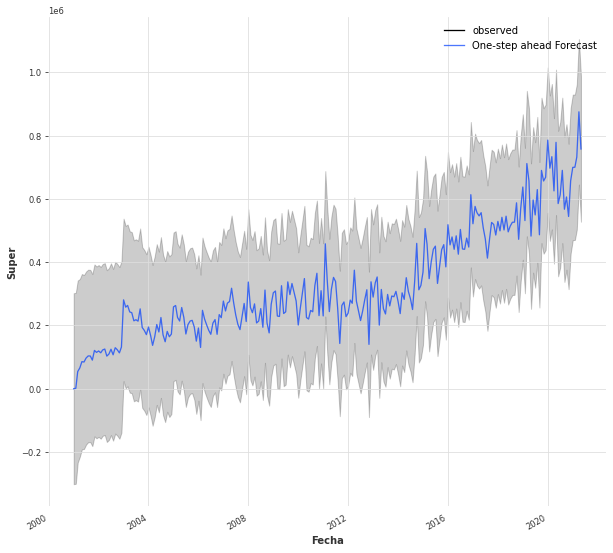

In [61]:
ax = data_consumo.GasolinaRegular['31/12/2021':].plot(label='observed')
pred.predicted_mean.plot(ax=ax, label='One-step ahead Forecast', alpha=.7)

ax.fill_between(pred_ci.index,
 pred_ci.iloc[:, 0],
 pred_ci.iloc[:, 1], color='k', alpha=.2)

ax.set_xlabel('Fecha')
ax.set_ylabel('Super')
plt.legend()

plt.show()

### 2021 Regular Importaciones

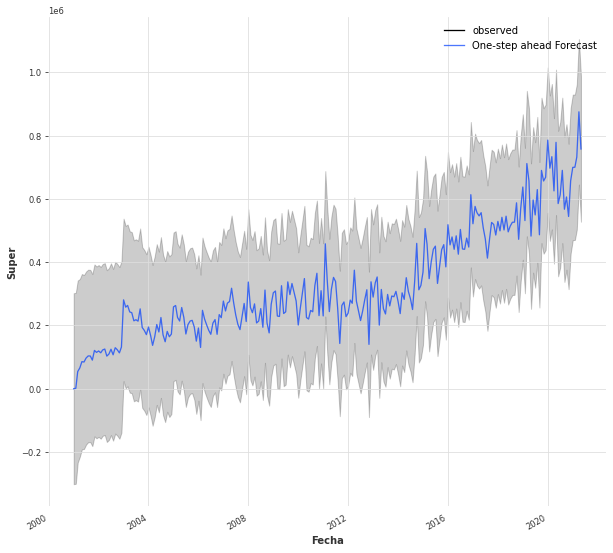

In [64]:
ax = data_importaciones.GasolinaSuper['31/12/2021':].plot(label='observed')
pred.predicted_mean.plot(ax=ax, label='One-step ahead Forecast', alpha=.7)

ax.fill_between(pred_ci.index,
 pred_ci.iloc[:, 0],
 pred_ci.iloc[:, 1], color='k', alpha=.2)

ax.set_xlabel('Fecha')
ax.set_ylabel('Super')
plt.legend()

plt.show()

En ambas gráficas se ve que en el 2021 va a ir aumentando, ya que después del bajón que hubo en el 2020 por la pandemia, es lo lógica que suba ya que todo va volviendo 